This notebook is part the of Dr. Christoforos Christoforou's course materials. You may not, nor may you knowingly allow others to reproduce or distribute lecture notes, course materials or any of their derivatives without the instructor's express written consent.

# Problem Set 02 - Cross Correlation 
**Professor:** Dr. Christoforos Christoforou

For this problem set you will need the following libraries, which are pre-installed with the colab environment: 

* [Numpy](https://www.numpy.org/) is an array manipulation library, used for linear algebra, Fourier transform, and random number capabilities.
* [Pandas](https://pandas.pydata.org/) is a library for data manipulation and data analysis.
* [CV2](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_gui/py_image_display/py_image_display.html) is a library for computer vision tasks.
* [Skimage](https://scikit-image.org/) is a library which supports image processing applications on python.
* [Matplotlib](https://matplotlib.org/) is a library which generates figures and provides graphical user interface toolkit.

You can load them using the following import statement:

In [6]:
import numpy as np
import pandas as pd
import cv2 as cv 
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

## Image Sources 
For this problem set you are asked to load and pre-process images. You can choose to use your own images, or download images from the following sources:

**Image source examples**

- [Place Kitten API](https://placekitten.com/) - use the base Place Kitten URL followed by a width and height separated by backslashes ''/''. For example, use the URL `https://placekitten.com/500/300` to fetch a cat image with a width of 500px and height of 300px.

- [Lorem Picsum Photos API ](https://picsum.photos/images) - generates random images from the web.

- [NC State University Libraries Special Collections](https://d.lib.ncsu.edu/collections/catalog) - browse the site to find an image thumbnail. Right-click on the thumbnail and select "Copy Image Address". The address will look like this: `https://iiif.lib.ncsu.edu/iiif/0051230/square/300,/0/default.jpg`. Replace the word "square" with the word "full" and replace "300" with "800" to access the full image at a width of 800px.

- [Google Image search](https://www.google.com/imghp?hl=en) - search for an image. Left-click one of the returned images, then right-click on the full image, and then select "Copy Image Address".


## Example code 

The code below illustrates how to use OpenCV to filter images by applying the cross-correlation operator. Try to reproduce the code in the cell below; you can use this sample code as a reference to implement the exercises that follow in this problem set. 

```python

# load the input image and convert it to grayscale
# - use the io.imread method from skimage package to read an image from url. 
# - use cv form opencv package to change the the image to grayscale. 

url = "https://placekitten.com/255/256"
image = io.imread(url) 
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY) 

#
# Define the kernel to use:  
# 
kernel_choice = "box"

if kernel_choice == "box":
  # Box filter - size 9 
  kernel = np.ones((9,9),np.float32)/81
elif kernel_choice =="gauss":
  # Gaussian filter - kernel size 5, sigma 5
  kernel = cv.getGaussianKernel(ksize=5,sigma=5)

#
# Use cv.filter2D from the openCV package - applies cross-correlation with a given kernel
#

# apply filter to the grayscale imager. 
gray_conv = cv.filter2D(gray, -1, kernel)

# apply filter to the colored image. 
image_conv = cv.filter2D(image, -1, kernel)

#
# Display the images.
#

plt.figure(figsize=(100,100))
# show the grayscale image. 
plt.subplot(2,2,1)
plt.imshow(image)
plt.xticks([]), plt.yticks([]), plt.title('Original Colored')

plt.subplot(2,2,2)
plt.imshow(image_conv)
plt.xticks([]), plt.yticks([]), plt.title('Averaged colored')

# show the grayscale image. 
plt.subplot(2,2,3)
plt.imshow(gray, cmap='gray')
plt.xticks([]), plt.yticks([]), plt.title('Original Gratscake')
plt.subplot(2,2,4)
plt.imshow(gray_conv, cmap='gray')
plt.xticks([]), plt.yticks([]), plt.title('Average Grayscale')

```



(([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>),
 Text(0.5, 1.0, 'Average Grayscale'))

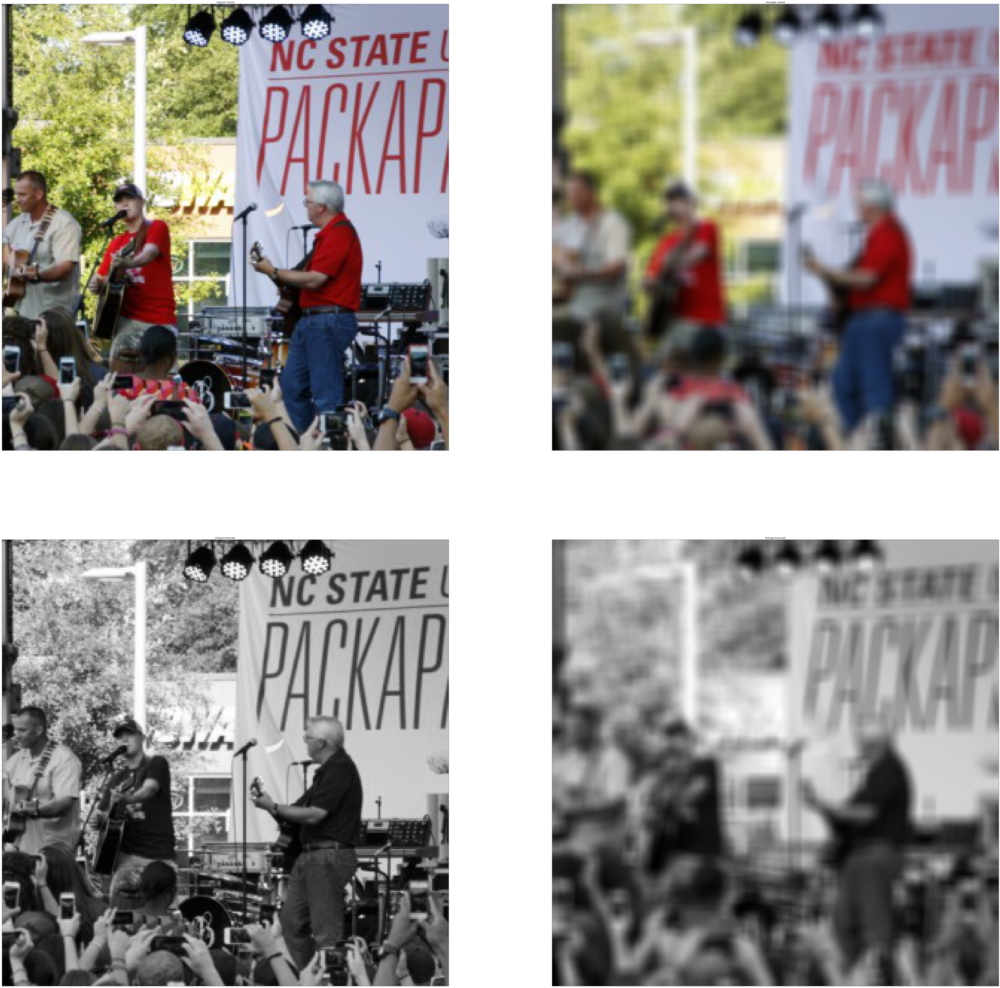

In [15]:
# TODO: Use this cell to reporduce the code above. 
# - Try to use different images from the one provided.
# - Try to change the size, and the standard sigma for the kernel.

import numpy as np
import pandas as pd
import cv2 as cv 
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

url = "https://iiif.lib.ncsu.edu/iiif/mc00336-Packapalooza2013-022Coach-Scotty-Chancellor/square/300,/0/default.jpg"
image = io.imread(url) 
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY) 

#
# Define the kernel to use:  
# 
kernel_choice = "box"

if kernel_choice == "box":
  # Box filter - size 9 
  kernel = np.ones((9,9),np.float32)/81
elif kernel_choice =="gauss":
  # Gaussian filter - kernel size 5, sigma 5
  kernel = cv.getGaussianKernel(ksize=10,sigma=10)                 # Changed kernal and sigma to 10

#
# Use cv.filter2D from the openCV package - applies cross-correlation with a given kernel
#

# apply filter to the grayscale imager. 
gray_conv = cv.filter2D(gray, -1, kernel)

# apply filter to the colored image. 
image_conv = cv.filter2D(image, -1, kernel)

#
# Display the images.
#

plt.figure(figsize=(100,100))
# show the grayscale image. 
plt.subplot(2,2,1)
plt.imshow(image)
plt.xticks([]), plt.yticks([]), plt.title('Original Colored')

plt.subplot(2,2,2)
plt.imshow(image_conv)
plt.xticks([]), plt.yticks([]), plt.title('Averaged colored')

# show the grayscale image. 
plt.subplot(2,2,3)
plt.imshow(gray, cmap='gray')
plt.xticks([]), plt.yticks([]), plt.title('Original Gratscake')
plt.subplot(2,2,4)
plt.imshow(gray_conv, cmap='gray')
plt.xticks([]), plt.yticks([]), plt.title('Average Grayscale')


## Exercise 02: Generating Noisy images.

**Task 2.1**. Implement a function called `addGaussianNoise(img,sigma)` that takes as an input argument an image (img) and a noise level `sigma`, and return a noisy version of the image by adding gaussian noise. 


**Task 2.2**. Implement a function called `addSaltAndPepperNoise(img,noise_level)` that takes as an input argument an image (img) and a noise level `noise_level`, and return a noisy version of the image by adding salt and pepper noise. The noise_level would be a number between 0..1, which denotes the probability a pixel is converted to a noisy pixel. 

**Task 2.3**. Implement a function called `addImpulseNoise(img,noise_level)` that takes as an input argument an image (img) and a noise level `noise_level`, and return a noisy version of the image by adding salt and pepper noise. The noise_level would be a number between 0..1, which denotes the probability a pixel is converted to a noisy pixel. 


(([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>),
 Text(0.5, 1.0, 'Average Grayscale'))

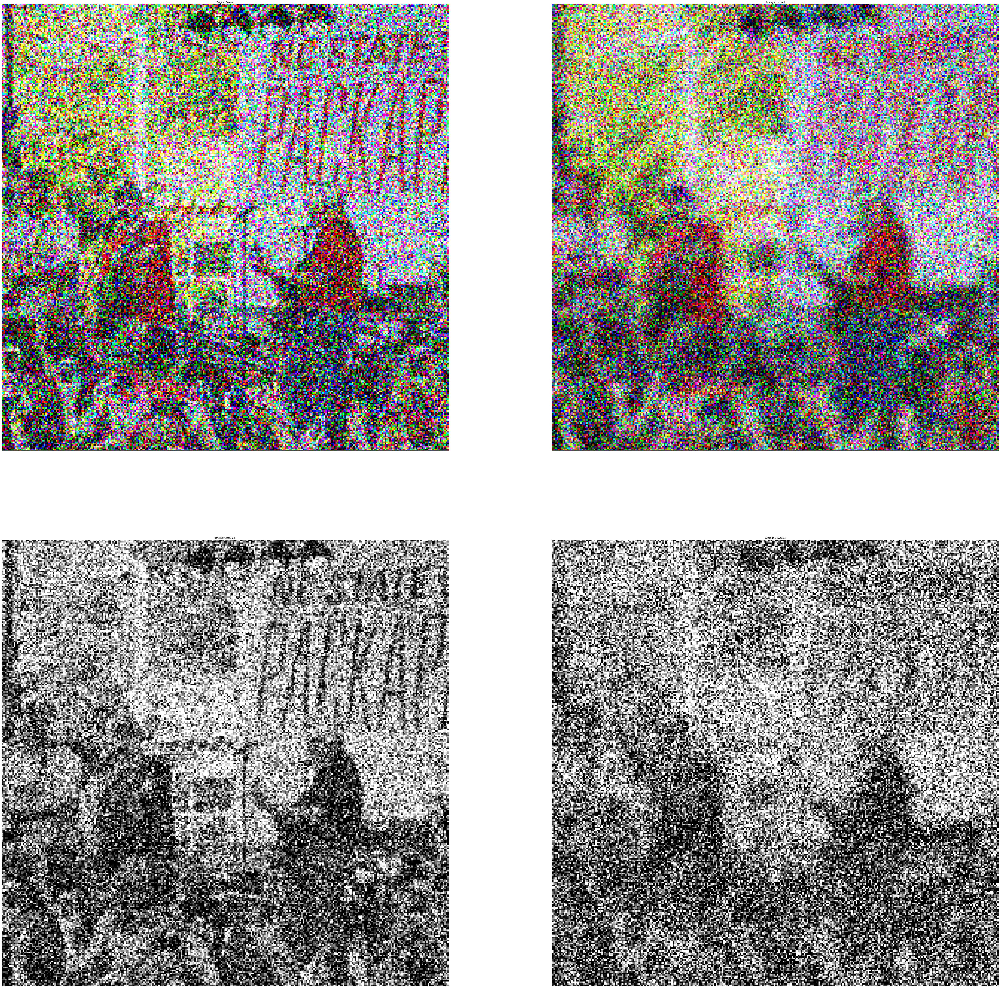

In [21]:
# Implement Task 2.1 here.

import numpy as np
from skimage.util import random_noise
import pandas as pd
import cv2 as cv 
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt
import random
import cv2
import requests 
from io import BytesIO

def gaussian(img, sigma):   
    im_arr = np.asarray(img)
    noise_img = random_noise(im_arr, mode='gaussian', var=sigma)
    noise_img = (255*noise_img).astype(np.uint8)

    img_final = Image.fromarray(noise_img)
    return img_final

url = "https://iiif.lib.ncsu.edu/iiif/mc00336-Packapalooza2013-022Coach-Scotty-Chancellor/square/300,/0/default.jpg"
image = io.imread(url) 
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY) 

#
# Define the kernel to use:  
# 
kernel_choice = "box"

if kernel_choice == "box":
  # Box filter - size 9 
  kernel = np.ones((9,9),np.float32)/81
elif kernel_choice =="gauss":
  # Gaussian filter - kernel size 5, sigma 5
  kernel = cv.getGaussianKernel(ksize=10,sigma=10)                 # Changed kernal and sigma to 10

#
# Use cv.filter2D from the openCV package - applies cross-correlation with a given kernel
#

# apply filter to the grayscale imager. 
gray_conv = cv.filter2D(gray, -1, kernel)

# apply filter to the colored image. 
image_conv = cv.filter2D(image, -1, kernel)

#
# Display the images.
#

plt.figure(figsize=(100,100))
# show the grayscale image. 
plt.subplot(2,2,1)
original = gaussian(image, .3)
plt.imshow(original)
plt.xticks([]), plt.yticks([]), plt.title('Original Colored')

plt.subplot(2,2,2)
plt.imshow(gaussian(image_conv, .2))
plt.xticks([]), plt.yticks([]), plt.title('Averaged colored')

# show the grayscale image. 
plt.subplot(2,2,3)
plt.imshow(gaussian(gray, .2), cmap='gray')
plt.xticks([]), plt.yticks([]), plt.title('Original Gratscake')
plt.subplot(2,2,4)
plt.imshow(gaussian(gray_conv, .3), cmap='gray')
plt.xticks([]), plt.yticks([]), plt.title('Average Grayscale')


(([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>),
 Text(0.5, 1.0, 'Average Grayscale'))

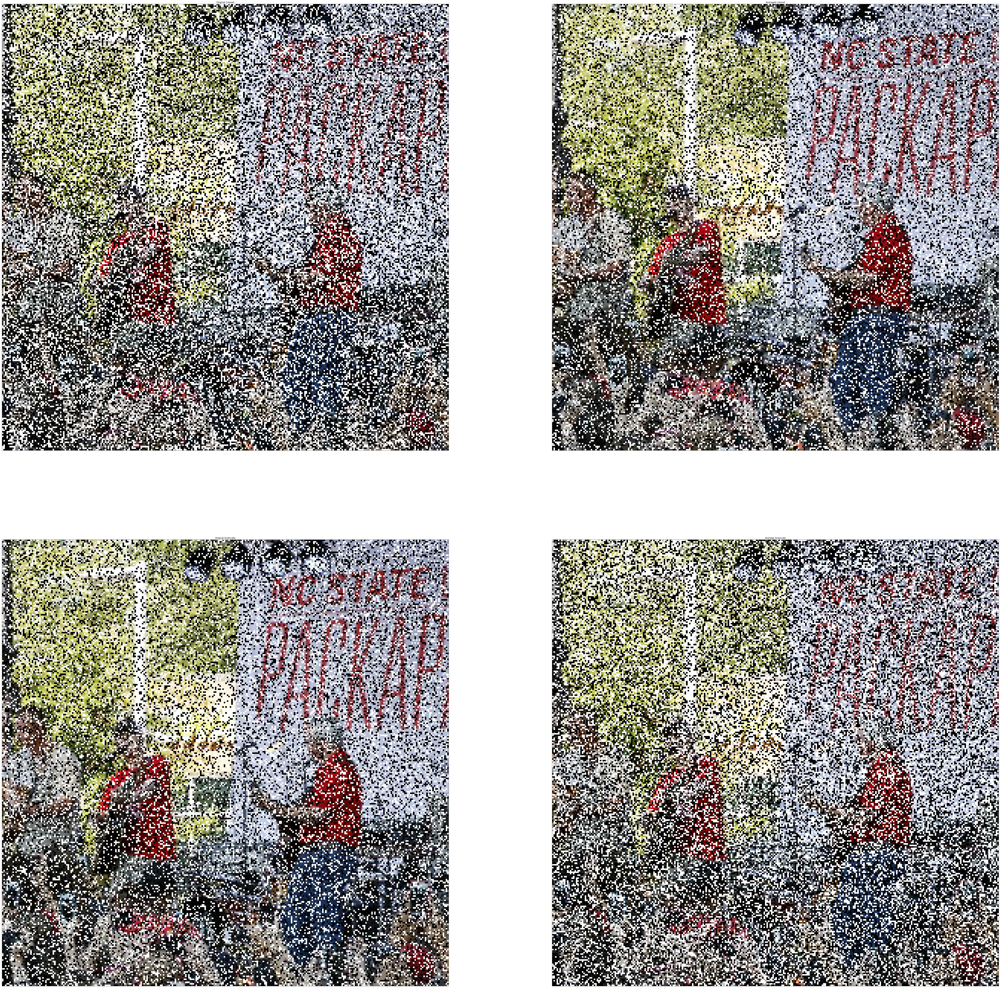

In [23]:
# Implement Task 2.2 here.

import numpy as np
from skimage.util import random_noise
import pandas as pd
import cv2 as cv 
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt
import random
import cv2
import requests 
from io import BytesIO

def sp(img, prob):
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

url = "https://iiif.lib.ncsu.edu/iiif/mc00336-Packapalooza2013-022Coach-Scotty-Chancellor/square/300,/0/default.jpg"
image = io.imread(url) 
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY) 

#
# Define the kernel to use:  
# 
kernel_choice = "box"

if kernel_choice == "box":
  # Box filter - size 9 
  kernel = np.ones((9,9),np.float32)/81
elif kernel_choice =="gauss":
  # Gaussian filter - kernel size 5, sigma 5
  kernel = cv.getGaussianKernel(ksize=10,sigma=10)                 # Changed kernal and sigma to 10

#
# Use cv.filter2D from the openCV package - applies cross-correlation with a given kernel
#

# apply filter to the grayscale imager. 
gray_conv = cv.filter2D(gray, -1, kernel)

# apply filter to the colored image. 
image_conv = cv.filter2D(image, -1, kernel)

#
# Display the images.
#

plt.figure(figsize=(100,100))
# show the grayscale image. 
plt.subplot(2,2,1)
original = sp(image, .3)
plt.imshow(original)
plt.xticks([]), plt.yticks([]), plt.title('Original Colored')

plt.subplot(2,2,2)
plt.imshow(sp(image_conv, .2))
plt.xticks([]), plt.yticks([]), plt.title('Averaged colored')

# show the grayscale image. 
plt.subplot(2,2,3)
plt.imshow(sp(gray, .2), cmap='gray')
plt.xticks([]), plt.yticks([]), plt.title('Original Gratscake')
plt.subplot(2,2,4)
plt.imshow(sp(gray_conv, .3), cmap='gray')
plt.xticks([]), plt.yticks([]), plt.title('Average Grayscale')


(([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>),
 Text(0.5, 1.0, 'Average Grayscale'))

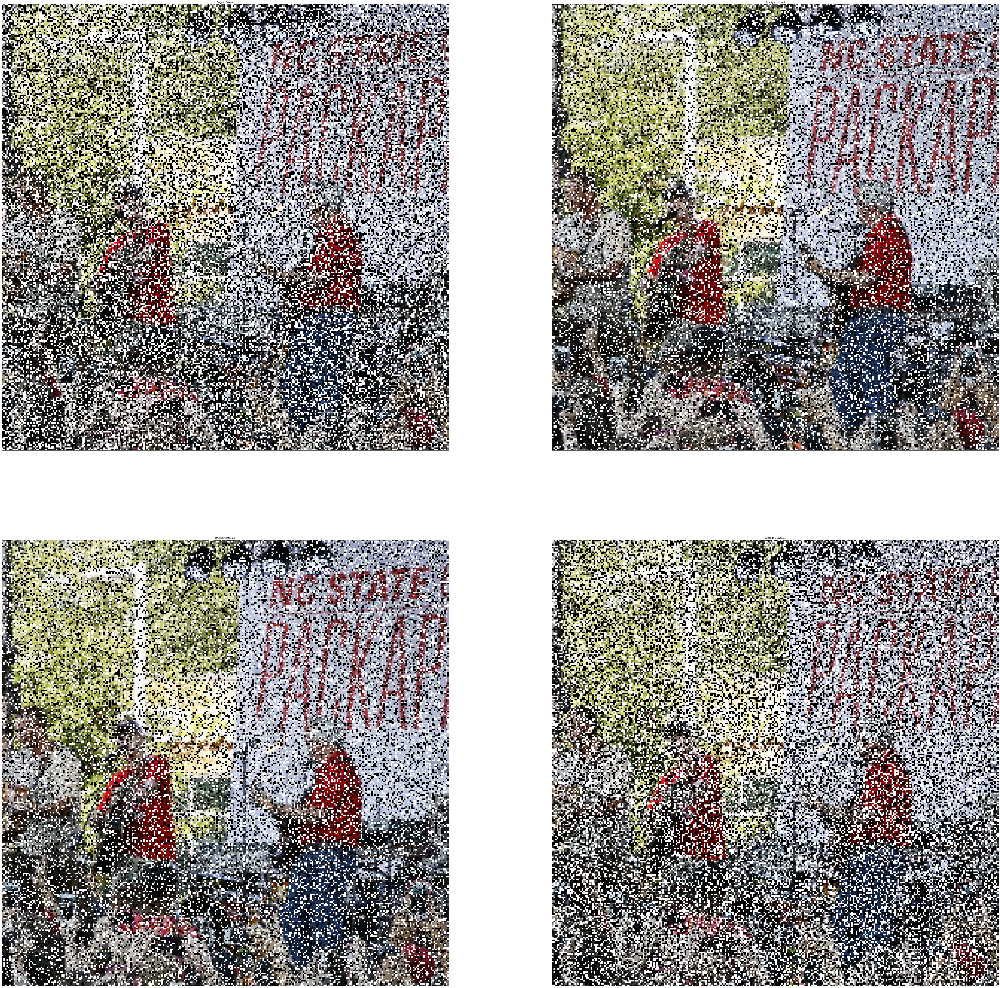

In [25]:
# Implement Task 2.3 here.

import numpy as np
from skimage.util import random_noise
import pandas as pd
import cv2 as cv 
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt
import random
import cv2
import requests 
from io import BytesIO

def addImpulseNoise(img, noise_level):
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - noise_level 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < noise_level:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output


url = "https://iiif.lib.ncsu.edu/iiif/mc00336-Packapalooza2013-022Coach-Scotty-Chancellor/square/300,/0/default.jpg"
image = io.imread(url) 
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY) 

#
# Define the kernel to use:  
# 
kernel_choice = "box"

if kernel_choice == "box":
  # Box filter - size 9 
  kernel = np.ones((9,9),np.float32)/81
elif kernel_choice =="gauss":
  # Gaussian filter - kernel size 5, sigma 5
  kernel = cv.getGaussianKernel(ksize=10,sigma=10)                 # Changed kernal and sigma to 10

#
# Use cv.filter2D from the openCV package - applies cross-correlation with a given kernel
#

# apply filter to the grayscale imager. 
gray_conv = cv.filter2D(gray, -1, kernel)

# apply filter to the colored image. 
image_conv = cv.filter2D(image, -1, kernel)

#
# Display the images.
#

plt.figure(figsize=(100,100))
# show the grayscale image. 
plt.subplot(2,2,1)
original = addImpulseNoise(image, .3)
plt.imshow(original)
plt.xticks([]), plt.yticks([]), plt.title('Original Colored')

plt.subplot(2,2,2)
plt.imshow(addImpulseNoise(image_conv, .2))
plt.xticks([]), plt.yticks([]), plt.title('Averaged colored')

# show the grayscale image. 
plt.subplot(2,2,3)
plt.imshow(addImpulseNoise(gray, .2), cmap='gray')
plt.xticks([]), plt.yticks([]), plt.title('Original Gratscake')
plt.subplot(2,2,4)
plt.imshow(addImpulseNoise(gray_conv, .3), cmap='gray')
plt.xticks([]), plt.yticks([]), plt.title('Average Grayscale')


## Exercise 3: Apply filtering using OpenCV library. 

**Task 3.1** Identify an image from the web, load it in python and generate two noisy versions of the input image, one by adding Gaussian noise and a second by salt and pepper noise. Use the functions you implemented in the previous exercise. Display the resulting images.


**Task 3.2** Compare the effects of denoising using box filter vs a gaussian filter on each image, as you change the level of noise. Try at least 5 different noise levels for each noise type, and keep the kernel size fixed. For each parameter configuration, display the four images in a single row as follows: 

  - show the original image, use title "Original" 
  - display the noisy image, in title indicate the noise type and noise level. 
  - display the filtered images using a gaussian filter. 
  - display the filtered image using the box filter. 
  

**Task 3.3** Compare the effects of kernel-size and standard-deviation when using a Gaussian filter. Try applying a gaussian filter of kernel sizes 3,5,7,11,and 15 and try different standard deviation Configurations. Use one of the noisy images you generated previously, keep the noise level fixed. For each parameter configuration display the image resulting images in a single row, as follows: 
  
  - Display the noisy image, use title "Noisy" 
  - display the filtered images using a gaussian filter; in title indicate the kernel size, and standard deviations used. 

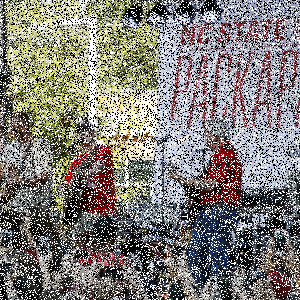

In [31]:
# Implement Task 3.1 here.

import numpy as np
from skimage.util import random_noise
import pandas as pd
import cv2 as cv 
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt
import random
import cv2
import requests 
from io import BytesIO

def addImpulseNoise(img, noise_level):
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - noise_level 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < noise_level:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
                
    img_final = Image.fromarray(output)
    return img_final

addImpulseNoise("https://iiif.lib.ncsu.edu/iiif/mc00336-Packapalooza2013-022Coach-Scotty-Chancellor/square/300,/0/default.jpg", .2)

(([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>),
 Text(0.5, 1.0, 'Average Grayscale'))

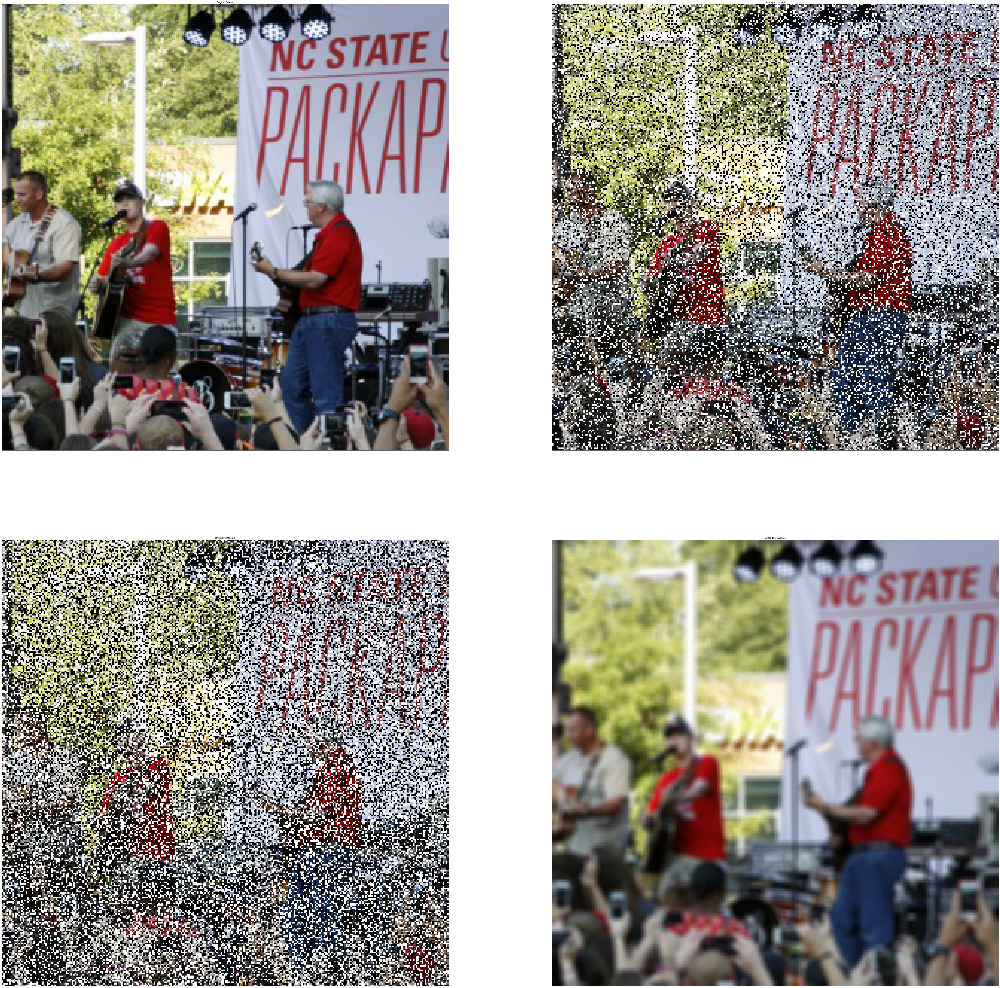

In [11]:
# Implement Task 3.2 here.

# Implement Task 2.3 here.

import numpy as np
from skimage.util import random_noise
import pandas as pd
import cv2 as cv 
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt
import random
import cv2
import requests 
from io import BytesIO

def gaussian(img, noise_level):
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - noise_level 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < noise_level:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

def box(img, noise_level):
    blur = cv2.boxFilter(img,-1,(5,5), normalize = True)
    return blur

url = "https://iiif.lib.ncsu.edu/iiif/mc00336-Packapalooza2013-022Coach-Scotty-Chancellor/square/300,/0/default.jpg"
image = io.imread(url) 
#
# Display the images.
#

plt.figure(figsize=(100,100))
# show the grayscale image. 
plt.subplot(2,2,1)
plt.imshow(image)
plt.xticks([]), plt.yticks([]), plt.title('Original Colored')

plt.subplot(2,2,2)
plt.imshow(gaussian(image, .2))
plt.xticks([]), plt.yticks([]), plt.title('static')

# show the grayscale image. 
plt.subplot(2,2,3)
plt.imshow(gaussian(image, .3))
plt.xticks([]), plt.yticks([]), plt.title('Gaussian')
plt.subplot(2,2,4)
plt.imshow(box(image, .3), cmap='gray')
plt.xticks([]), plt.yticks([]), plt.title('Box')

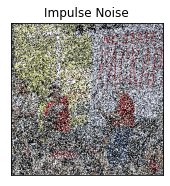

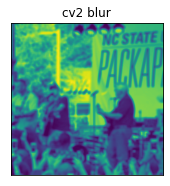

In [53]:
# Implement Task 3.3 here.
import numpy as np
from skimage.util import random_noise
import pandas as pd
import cv2 as cv 
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt
import random
import cv2
import requests 
from io import BytesIO

def load_img():
    res = requests.get("https://iiif.lib.ncsu.edu/iiif/mc00336-Packapalooza2013-022Coach-Scotty-Chancellor/square/300,/0/default.jpg")
    img = Image.open(BytesIO(res.content)) 
    img_data = np.asarray(img)
    
    return img_data

def addImpulseNoise(image, noise_level):
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - noise_level 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < noise_level:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    plt.subplot(122),plt.imshow(output),plt.title('Impulse Noise')
    plt.xticks([]), plt.yticks([])
    plt.show()

def gaussian(img, kernel):
    blur = cv2.blur(img,(5,5))
    plt.subplot(122),plt.imshow(blur),plt.title('cv2 blur')
    plt.xticks([]), plt.yticks([])
    plt.show()

addImpulseNoise(load_img(), .3)

gaussian(load_image(), 3)





## Exercse 4: Implementing convolution from scratch 

Image filtering (or convolution) is a fundamental image processing tool. In this exercise, you will be writing your own function to implement image filtering from scratch. More specifically, you will implement the function `my_filter2D()` which imitates the filter2D function in the OpenCV library. 

Your filtering algorithm must 
- (1) support grayscale and color images 
- (2) support arbitrary shaped filters, as long as both dimensions are odd (e.g. 7x9 filters but not 4x5 filters) 
- (3) pad the input image with zeros or reflected image content and 
- (4) return a filtered image which is the same resolution as the input image. 

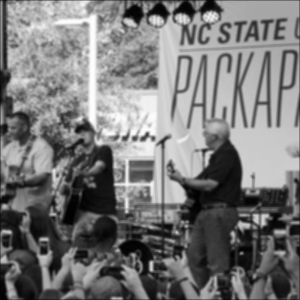

In [25]:
import numpy as np
from skimage.util import random_noise
import pandas as pd
import cv2 as cv 
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt
import random
import cv2
import requests 
from io import BytesIO

def load_image():
    url = "https://iiif.lib.ncsu.edu/iiif/mc00336-Packapalooza2013-022Coach-Scotty-Chancellor/square/300,/0/default.jpg"
    image = io.imread(url)
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY) 
    return gray

def my_filter2D(image, kernel):
    # Flip the kernel
    kernel = np.flipud(np.fliplr(kernel))
    # convolution output
    output = np.zeros_like(image)

    image_padded = np.zeros((image.shape[0] + 2, image.shape[1] + 2))
    image_padded[1:-1, 1:-1] = image

    # Loop over every pixel of the image
    for x in range(image.shape[1]):
        for y in range(image.shape[0]):
            output[y, x] = (kernel * image_padded[y: y+3, x: x+3]).sum()

    return output

# kernel
KERNEL = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

# kernel to be used for sharpen
image_sharpen = my_filter2D(load_image(), kernel=KERNEL)

# kernel to be used for edge detection
image_edge1 = my_filter2D(load_image(), kernel=np.array([[-1, -1, -1], [-1, 4, -1], [-1, -1, -1]]))
image_edge2 = my_filter2D(load_image(), kernel=np.array([[-1, 0, 1], [0, 0, 0], [1, 0, -1]]))

# kernel to be used for box blur
imageboxblur = my_filter2D(load_image(), kernel=np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]])/9.0)

# kernel to be used for gaussian blur
imagegaussianblur = my_filter2D(load_image(), kernel=np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])/16.0)


# Pass any image filter variable to view results
img_final = Image.fromarray(imageboxblur)

img_final

## Exercse 5: Test your implementation
Demonstrate the correctness of your my_filter2D function implementation from Exercise 4, by applying it to different scenarios. Compare the output of your function to the corresponding output from when using cv.imfilter2D method provided by openCV library (i.e. show the two results side by side). In particular demonstrate the your implementation supports:

  - support grayscale and color images 
  - support arbitrary shaped filters, 
  - supports pad the input image with zeros or reflected image content 




my_filter


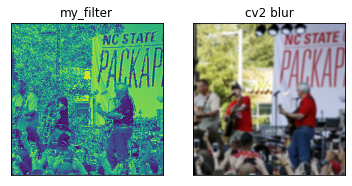

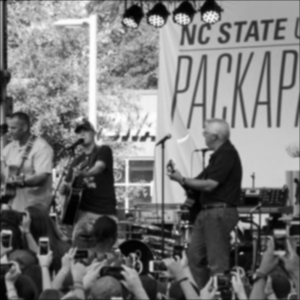

In [23]:
# Use this cell to implement excercise 5; Use one cell for each test. 
import numpy as np
from skimage.util import random_noise
import pandas as pd
import cv2 as cv 
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt
import random
import cv2
import requests 
from io import BytesIO

# kernel
KERNEL = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

def load_image():
    url = "https://iiif.lib.ncsu.edu/iiif/mc00336-Packapalooza2013-022Coach-Scotty-Chancellor/square/300,/0/default.jpg"
    image = io.imread(url)
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY) 
    return gray

def my_filter2D(image, kernel):
    # Flip the kernel
    kernel = np.flipud(np.fliplr(kernel))
    # convolution output
    output = np.zeros_like(image)

    image_padded = np.zeros((image.shape[0] + 2, image.shape[1] + 2))
    image_padded[1:-1, 1:-1] = image

    # Loop over every pixel of the image
    for x in range(image.shape[1]):
        for y in range(image.shape[0]):
            output[y, x] = (kernel * image_padded[y: y+3, x: x+3]).sum()

    return output

def cv2_blur(url, kernel):
    img = io.imread(url)
    blur = cv2.blur(img,(5,5))
    my_img = my_filter2D(load_image(), kernel)
    plt.subplot(121),plt.imshow(my_img),plt.title('my_filter')
    plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(blur),plt.title('cv2 blur')
    plt.xticks([]), plt.yticks([])
    plt.show()


# kernel to be used for sharpen
image_sharpen = my_filter2D(load_image(), kernel=KERNEL)

# kernel to be used for edge detection
image_edge1 = my_filter2D(load_image(), kernel=np.array([[-1, -1, -1], [-1, 4, -1], [-1, -1, -1]]))
image_edge2 = my_filter2D(load_image(), kernel=np.array([[-1, 0, 1], [0, 0, 0], [1, 0, -1]]))

# kernel to be used for box blur
imageboxblur = my_filter2D(load_image(), kernel=np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]])/9.0)

# kernel to be used for gaussian blur
imagegaussianblur = my_filter2D(load_image(), kernel=np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])/16.0)

img_final = Image.fromarray(imagegaussianblur)

cv2_blur("https://iiif.lib.ncsu.edu/iiif/mc00336-Packapalooza2013-022Coach-Scotty-Chancellor/square/300,/0/default.jpg", KERNEL)
img_final




Copyright Statement: Copyright © 2020 Christoforou. The materials provided by the instructor of this course, including this notebook, are for the use of the students enrolled in the course. Materials are presented in an educational context for personal use and study and should not be shared, distributed, disseminated or sold in print — or digitally — outside the course without permission. You may not, nor may you knowingly allow others to reproduce or distribute lecture notes, course materials as well as any of their derivatives without the instructor's express written consent.